<center> <h2> Distributed Machine Learning using KubeFlow for Air Quality Prediction Dataset
</h2></center

In [1]:
import kfp
from kfp import dsl
import kfp.components as components
from kfp.components import create_component_from_func

In [2]:
# Pipeline Component 1: Load air quality Dataset
def load_dataset_and_preprocess(minio_src_dataset_path: str, src_data_path: str, out_data_path: str):
    import pandas as pd
    from pathlib import Path
    from minio import Minio

    print("***Staring pipeline component to load air quality dataset***")

    # Create the directory if it does not exist
    src_data_path_path = Path(src_data_path)
    src_data_path_path.parent.mkdir(parents=True, exist_ok=True)

    out_data_path_path = Path(out_data_path)
    out_data_path_path.parent.mkdir(parents=True, exist_ok=True)

    print("Connecting to minio object store to get dataset")
    minio_client = Minio(
        "minio-service.kubeflow.svc.cluster.local:9000",
        access_key="minio",
        secret_key="minio123",
        secure=False
    )

    # Make sure the bucket exists
    bucket_name = "air-quality-time-series-dataset"
    if not minio_client.bucket_exists(bucket_name):
        print(f"{bucket_name} bucket doesn't exist. Creating now...")
        minio_client.make_bucket(bucket_name)
        print(f"{bucket_name} bucket created successfully.")

    # Load air quality dataset
    minio_client.fget_object(
        bucket_name=bucket_name,
        object_name=minio_src_dataset_path,
        file_path=src_data_path
    )

    df = pd.read_csv(src_data_path)
    print('Dataset Info: ')
    print(df.info())

    print(f"Fetched dataset from mioio path {minio_src_dataset_path} to : {src_data_path}")

    # Convert Timestamp column from object type to datetime
    df["Timestamp"] = pd.to_datetime(df["Timestamp"])

    # Create new column to store the date extracted from datetime
    df['Date'] = df["Timestamp"].dt.date
    print(df.head())

    # df_date is dataframe with average PM2.5 concentration for each day
    df_date = pd.DataFrame(df.groupby('Date')['PM2.5'].mean())

    # Save the processed data at out_data_path
    df_date.to_csv(out_data_path, index=False)

    print("***Completed pipeline component to load air quality dataset***")


In [3]:
# Pipeline Component 2: train-test-split component
def train_test_split(processed_data_path: str, model_train_data_path: str, model_val_data_path: str,
                     dataset_path: str, scaled_data_path: str):
    import numpy as np
    import pandas as pd
    from sklearn.model_selection import train_test_split
    from pathlib import Path
    from sklearn.preprocessing import MinMaxScaler
    import math

    print("***Starting pipeline component to train_test_split dataset***")

    # Create the directory if it does not exist
    model_train_data_path_path = Path(model_train_data_path)
    model_train_data_path_path.parent.mkdir(parents=True, exist_ok=True)

    model_val_data_path_path = Path(model_val_data_path)
    model_val_data_path_path.parent.mkdir(parents=True, exist_ok=True)

    scaled_data_path_path = Path(scaled_data_path)
    scaled_data_path_path.parent.mkdir(parents=True, exist_ok=True)

    dataset_path_path = Path(dataset_path)
    dataset_path_path.parent.mkdir(parents=True, exist_ok=True)

    # Load the processed data
    df_date = pd.read_csv(processed_data_path)

    # df_date is dataframe with average PM2.5 concentration for each day
    dataset = df_date.values

    # split training data with first 80% of data
    training_split = 0.8
    training_data_len = math.ceil(len(dataset) * training_split)

    # Min-Max data scaling for PM2.5 values
    sc = MinMaxScaler(feature_range=(0, 1))
    scaled_data = sc.fit_transform(dataset)

    # Take previous 60 instance to predict next instance
    # Here first i+60 instance becomes the input and next insatnce becomes the Y, and i is iterated over len(train_data) - 60
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    num = 60
    for i in range(num, len(train_data)):
        x_train.append(train_data[i - num:i, 0])
        y_train.append(train_data[i, 0])

    # convert the list to numpy array and Reshape to (batch_size, time_steps, 1)
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
    print('x_train data shape: ')
    print(x_train.shape)

    # Prepare validation dataset (x_val, y_val)
    #  80% training data is futher splitted into 90% of the 80% for training and 10% of the 80% for validation,
    train_split_index = int(len(x_train) * 0.9)

    x_train_new = x_train[:train_split_index]
    y_train_new = y_train[:train_split_index]

    x_val = x_train[train_split_index:]
    y_val = y_train[train_split_index:]

    # Min-Max data scaling for PM2.5 values
    sc = MinMaxScaler(feature_range=(0, 1))
    scaled_data = sc.fit_transform(dataset)
    print('PM2.5 Scaled Data: ')
    print(scaled_data)

    np.savez(model_train_data_path, x_train=x_train_new, y_train=y_train_new)
    np.savez(model_val_data_path, x_val=x_val, y_val=y_val)
    np.savez(scaled_data_path, scaled_data=scaled_data)
    np.savez(dataset_path, dataset=dataset)

    print(
        f"Data split and train data is saved to {model_train_data_path} and validation data is saved to {model_val_data_path}")

    print("***Completed pipeline component to train_test_split dataset***")


In [4]:
# Pipeline Component 3: Model Training
def train_model(model_train_data_path: str, model_val_data_path: str, model_save_path: str, model_export_path: str,
                epochs: int = 10):
    from keras import Sequential, Model
    from keras.src.layers import LSTM, Dense

    import numpy as np
    from pathlib import Path
    from minio import Minio
    import os
    import glob

    print("***Starting pipeline component to train model***")

    # Create the directory if it does not exist
    model_save_path_path = Path(model_save_path)
    model_save_path_path.parent.mkdir(parents=True, exist_ok=True)

    model_export_path_path = Path(model_export_path)
    model_export_path_path.parent.mkdir(parents=True, exist_ok=True)

    # Load the training data and validation data
    train_data = np.load(model_train_data_path, allow_pickle=True)
    x_train_new, y_train_new = train_data['x_train'], train_data['y_train']

    val_data = np.load(model_val_data_path, allow_pickle=True)
    x_val, y_val = val_data['x_val'], val_data['y_val']

    # Define a simple LSTM model
    lstm_model = Sequential()
    lstm_model.add(LSTM(50, return_sequences=True, input_shape=(60, 1)))
    lstm_model.add(LSTM(50, return_sequences=False))
    lstm_model.add(Dense(25))
    lstm_model.add(Dense(1))
    lstm_model.compile(optimizer='adam', loss='mean_squared_error')

    print("Model summary:")
    print(lstm_model.summary())

    epochs_num = epochs
    batch_size_num = 32
    print(f"Model training started for epochs={epochs} with batch size: {batch_size_num}")

    lstm_history = lstm_model.fit(x_train_new, y_train_new, batch_size=batch_size_num, epochs=epochs_num,
                                  validation_data=(x_val, y_val))

    # Save the model for test data prediction
    lstm_model.save(model_save_path)
    print(f"Trained model is saved at: {model_save_path}")

    # Export model for real time prediction
    lstm_model.export(model_export_path)
    print(f"Trained model is exported at: {model_save_path} for realtime prediction.")

    print("Connecting to minio object store to store dataset")
    minio_client = Minio(
        "minio-service.kubeflow.svc.cluster.local:9000",
        access_key="minio",
        secret_key="minio123",
        secure=False
    )
    bucket_name = "air-quality-time-series-dataset"

    def upload_local_directory_to_minio(local_path, bucket_name, minio_path):
        assert os.path.isdir(local_path)

        for local_file in glob.glob(local_path + '/**'):
            local_file = local_file.replace(os.sep, "/")  # Replace \ with / on Windows
            if not os.path.isfile(local_file):
                upload_local_directory_to_minio(
                    local_file, bucket_name, minio_path + "/" + os.path.basename(local_file))
            else:
                remote_path = os.path.join(
                    minio_path, local_file[1 + len(local_path):])
                remote_path = remote_path.replace(
                    os.sep, "/")  # Replace \ with / on Windows
                minio_client.fput_object(bucket_name, remote_path, local_file)

    upload_local_directory_to_minio(model_export_path, bucket_name, "models/lstm_timeseries/1/")  # 1 for version 1

    print("Saved model to minIO")

    print("***Completed pipeline component to train model***")


In [5]:
# Pipeline Component 4: katib Hyperparameter tuning
def hyperparameter_tune(experiment_trial_name: str, obj_metric_name: str):
    from kubeflow.katib import KatibClient, V1beta1ExperimentSpec, V1beta1AlgorithmSpec, V1beta1ObjectiveSpec, \
        V1beta1ParameterSpec, V1beta1TrialTemplate, V1beta1TrialTemplateSpec, V1beta1TrialParameterSpec, \
        V1beta1FeasibleSpace

    print("***Starting pipeline component for hyper parameter tuning***")
    experiment_name = experiment_trial_name

    # Define the objective
    objective_spec = V1beta1ObjectiveSpec(
        type="maximize",
        goal=0.9,
        objective_metric_name=obj_metric_name
    )

    # Define the algorithm
    algorithm_spec = V1beta1AlgorithmSpec(
        algorithm_name="random"
    )

    # Define the hyperparameters to tune
    parameters_spec = [
        V1beta1ParameterSpec(
            name="learning_rate",
            parameter_type="double",
            feasible_space=V1beta1FeasibleSpace(min="0.01", max="0.1")
        ),
        V1beta1ParameterSpec(
            name="batch_size",
            parameter_type="int",
            feasible_space=V1beta1FeasibleSpace(min="32", max="128")
        ),
    ]

    # Define the trial template
    trial_template_spec = V1beta1TrialTemplateSpec(
        primary_container_name="training-container",
        trial_parameters=[
            V1beta1TrialParameterSpec(
                name="learning_rate",
                description="Learning rate for the model",
                reference="learning_rate"
            ),
            V1beta1TrialParameterSpec(
                name="batch_size",
                description="Batch size",
                reference="batch_size"
            ),
        ],
        trial_spec={
            "apiVersion": "batch/v1",
            "kind": "Job",
            "spec": {
                "template": {
                    "spec": {
                        "containers": [
                            {
                                "name": "training-container",
                                "image": "your-training-image",
                                "command": [
                                    "python", "train.py",
                                    "--learning_rate=$(trialParameters.learning_rate)",
                                    "--batch_size=$(trialParameters.batch_size)"
                                ],
                            }
                        ],
                        "restartPolicy": "Never"
                    }
                }
            }
        }
    )

    experiment_spec = V1beta1ExperimentSpec(
        objective=objective_spec,
        algorithm=algorithm_spec,
        parameters=parameters_spec,
        trial_template=V1beta1TrialTemplate(trial_template_spec=trial_template_spec)
    )

    # Create the experiment
    katib_client = KatibClient()
    katib_client.create_experiment(
        experiment_name=experiment_name,
        namespace="kubeflow",
        experiment_spec=experiment_spec
    )
    print(f"Experiment {experiment_trial_name} submitted.")

    print("***Completed pipeline component for hyper parameter tuning***")


In [6]:
# Pipeline 5: Model Prediction
def predict(dataset_path: str, scaled_data_path: str, model_path: str, predictions_path: str):
    import tensorflow as tf
    import math
    import numpy as np
    from pathlib import Path
    from sklearn.preprocessing import MinMaxScaler

    print("***Starting pipeline component to predict***")

    model_path_path = Path(model_path)
    model_path_path.parent.mkdir(parents=True, exist_ok=True)

    predictions_path_path = Path(predictions_path)
    predictions_path_path.parent.mkdir(parents=True, exist_ok=True)

    # get dataset and scaled dataset
    # Load the dataset_path data and model_train_scaled_data_path data
    dataset_path_load = np.load(dataset_path, allow_pickle=True)
    dataset = dataset_path_load['dataset']

    scaled_data_path_path = np.load(scaled_data_path, allow_pickle=True)
    scaled_data = scaled_data_path_path['scaled_data']

    training_split = 0.8
    num = 60
    training_data_len = math.ceil(len(dataset) * training_split)

    # Get scaled test data from scaled dataset
    test_data = scaled_data[training_data_len - num:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(num, len(test_data)):
        x_test.append(test_data[i - num:i, 0])

    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Load the trained model
    lstm_model = tf.keras.models.load_model(model_path)
    print(f"Trained model is loaded from {model_path}")

    # Predict on the test dataset
    lstm_predictions = lstm_model.predict(x_test)

    sc = MinMaxScaler(feature_range=(0, 1))
    scaled_data = sc.fit_transform(dataset)
    lstm_predictions = sc.inverse_transform(lstm_predictions)

    # Save predictions and true value
    np.savez_compressed(predictions_path, lstm_predictions=lstm_predictions, y_test=y_test)
    print(f"Model predictions is saved at: {predictions_path}")

    print("***Completed pipeline component to predict***")


In [7]:
# Pipeline Component 6: Calculate Accuracy
def calculate_rmse_r2score(predictions_path: str):
    import numpy as np
    from pathlib import Path
    from sklearn.metrics import r2_score

    print("***Starting pipeline component to calculate model RMSE and R2 Score***")

    predictions_path_path = Path(predictions_path)
    predictions_path_path.parent.mkdir(parents=True, exist_ok=True)

    # Load predictions and test labels
    data = np.load(predictions_path)
    lstm_predictions, y_test = data['lstm_predictions'], data['y_test']
    print(f"Model predictions is loaded from: {predictions_path}")

    # RMSE and R2 score for regression model
    lstm_rmse = np.sqrt(np.mean(lstm_predictions - y_test) ** 2)

    r2_lstm = r2_score(y_test, lstm_predictions)

    print("Accuracy: ")
    print(f"RMSE: {lstm_rmse} and R2: {r2_lstm}")

    print("***Completed pipeline component to calculate model RMSE and R2 Score***")


In [8]:
# Pipeline Component 7: Serve saved model via kserve
def model_serving(model_save_path: str):
    print("***Starting pipeline component to serve model via kserve***")

    from kubernetes import client
    from kserve import KServeClient
    from kserve import constants
    from kserve import utils
    from kserve import V1beta1InferenceService
    from kserve import V1beta1InferenceServiceSpec
    from kserve import V1beta1PredictorSpec
    from kserve import V1beta1TFServingSpec
    from datetime import datetime

    namespace = namespace = 'kubeflow-user-example-com'# utils.get_default_target_namespace()
    
    print(f"Serving model from {model_save_path}")

    name='air-quality-prediction-serving'
    kserve_version='v1beta1'
    api_version = constants.KSERVE_GROUP + '/' + kserve_version

    isvc = V1beta1InferenceService(api_version=api_version,
                                   kind=constants.KSERVE_KIND,
                                   metadata=client.V1ObjectMeta(
                                       name=name, namespace=namespace, annotations={'sidecar.istio.io/inject':'false'}),
                                   spec=V1beta1InferenceServiceSpec(
                                   predictor=V1beta1PredictorSpec(
                                       service_account_name="sa-minio-kserve",
                                       tensorflow=(V1beta1TFServingSpec(
                                           storage_uri="s3://air_quality/models/air_quality_predictor/"))))
    )

    KServe = KServeClient()
    KServe.create(isvc)

    print("***Completed kubeflow component to serve model via kserve***")

In [9]:
# Convert functions to kubeflow pipeline components
load_dataset_op = create_component_from_func(load_dataset_and_preprocess, base_image='manglamsingh10/base-pod:latest')
train_test_split_op = create_component_from_func(train_test_split, base_image='manglamsingh10/base-pod:latest')
train_model_op = create_component_from_func(train_model, base_image='manglamsingh10/base-pod:latest')
katib_tune_model_op = create_component_from_func(hyperparameter_tune, base_image='manglamsingh10/base-pod:latest')
predict_op = create_component_from_func(predict, base_image='manglamsingh10/base-pod:latest')
calculate_accuracy_op = create_component_from_func(calculate_rmse_r2score, base_image='manglamsingh10/base-pod:latest')
kserve_model_op = create_component_from_func(model_serving, base_image='manglamsingh10/base-pod:latest')

In [10]:
# Define the pipeline
@dsl.pipeline(
    name='Air quality india prediction pipeline',
    description='An pipeline for Air quality india prediction pipeline with TensorFlow and Kubeflow'
)
def air_quality_india_prediction_pipeline(epochs: int = 1):
    from datetime import datetime

    timestamp = datetime.now().strftime("%Y%m%d%H%M%S")
    vop = dsl.VolumeOp(
        name=f"shared-pv--{timestamp}",
        resource_name=f"shared-pv-{timestamp}",  # Unique resource_name
        size="150Gi",
        modes=dsl.VOLUME_MODE_RWM)

    data_path = "/mnt/data"

    # Step 1: Load air quality india Dataset
    minio_src_dataset_path = "dataset/air-quality-india.csv"
    src_data_path = '/mnt/data/dataset/air-quality-india.csv'
    out_data_path = '/mnt/data/dataset/processed_dataset'
    load_data_task = load_dataset_op(minio_src_dataset_path=minio_src_dataset_path, src_data_path=src_data_path,
                                     out_data_path=out_data_path).add_pvolumes({data_path: vop.volume})

    # Step 2: train_test_split
    model_train_data_path = '/mnt/data/dataset/train/train.npz'
    model_val_data_path = '/mnt/data/dataset/validation/val.npz'
    dataset_path = '/mnt/data/dataset/dataset/dataset.npz'
    scaled_data_path = '/mnt/data/dataset/scaled/scaled_dataset.npz'
    train_test_split_task = train_test_split_op(processed_data_path=out_data_path,
                                                model_train_data_path=model_train_data_path,
                                                model_val_data_path=model_val_data_path, dataset_path=dataset_path,
                                                scaled_data_path=scaled_data_path) \
        .add_pvolumes({data_path: vop.volume}).after(load_data_task)

    # Step 3: Model Training
    model_save_path = '/mnt/data/model/air_quality_model.h5'
    model_export_path = '/mnt/data/model/serve/air_quality_model'
    train_model_task = train_model_op(model_train_data_path=model_train_data_path,
                                      model_val_data_path=model_val_data_path,
                                      model_save_path=model_save_path, model_export_path=model_export_path) \
        .add_pvolumes({data_path: vop.volume}).after(train_test_split_task)

    # Step 4: Model hyper-parameter tuning via katib
    experiment_trial_name = 'Air Quality Predict Exp'
    obj_metric_name = 'r2_score'
    tune_model_task = katib_tune_model_op(experiment_trial_name=experiment_trial_name, obj_metric_name=obj_metric_name) \
        .add_pvolumes({data_path: vop.volume}).after(train_model_task)

    # Step 5: Model Prediction
    predictions_path = '/mnt/data/output/prediction/predictions.npz'
    predict_task = predict_op(dataset_path=dataset_path, scaled_data_path=scaled_data_path, model_path=model_save_path,
                                predictions_path=predictions_path) \
        .add_pvolumes({data_path: vop.volume}).after(tune_model_task)

    # Step 6: Calculate Accuracy
    performance_task = calculate_accuracy_op(predictions_path=predictions_path) \
        .add_pvolumes({data_path: vop.volume}).after(predict_task)

    # Step 7: Serve model
    kserve_model_op(model_save_path=model_save_path) \
        .add_pvolumes({data_path: vop.volume}).after(performance_task)

In [11]:
# Save pipeline yaml configuration
kfp.compiler.Compiler().compile(air_quality_india_prediction_pipeline, 'air_quality_india_prediction_pipeline.yaml')

# Upload this yaml file to kubeflow to start the pipeline. We can also trigger the pipeline from code via kfp clinet

### Execution Details & Outputs:

#### Dataset Used
Using India Air Quality dataset to predict the furute values for PM2.5. Dataset contains PM2.5 value at each hour. <br /> Using Minio and shared Persistent Volumes (PV) and Persistent Volume Claims (PVC) to store and share the data among components.

minio used to store dataset and model (Shared across all kubeflow component container):
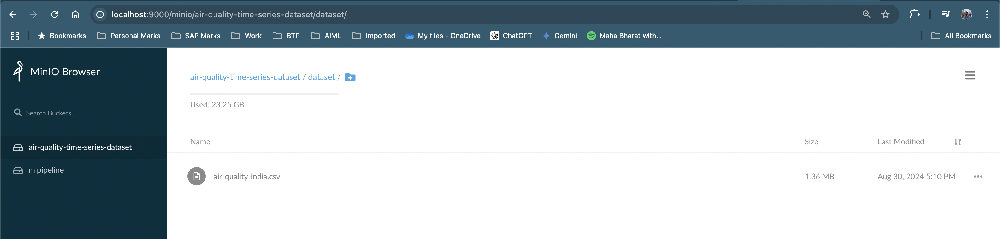

LSTM model store:
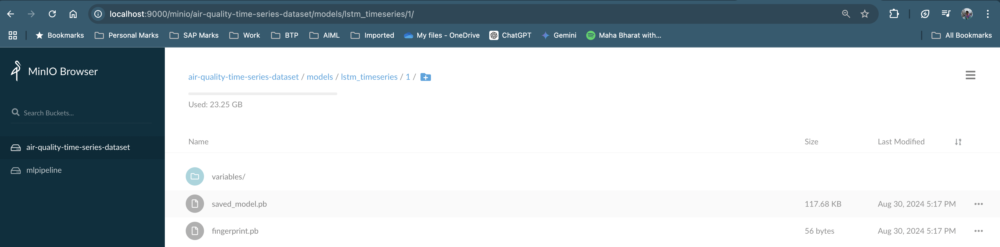

#### Create a K8s cluster with sufficient resources:
Created a local Minikube cluster with Docker, 6 CPUs, 150GB disk size, 12GB memory, and a local folder mounted as a shared directory among Kubeflow nodes. <br /><b>Command used to start the cluster:</b> <br />
    <code>minikube start --driver=docker --memory=12288 --cpus=6 --disk-size=150g --mount --mount-string /Users/i550363/BITS/Semester_3/DML/Assignment-1:/mnt/data</code>

### Deploy a Kubeflow pipeline for Timeseries data mdel

Used Kubeflow pipeline components to load data, preprocess, perform train-test split, train the model, predict etc., within a pipeline.

Kubeflow Pipeline Run:
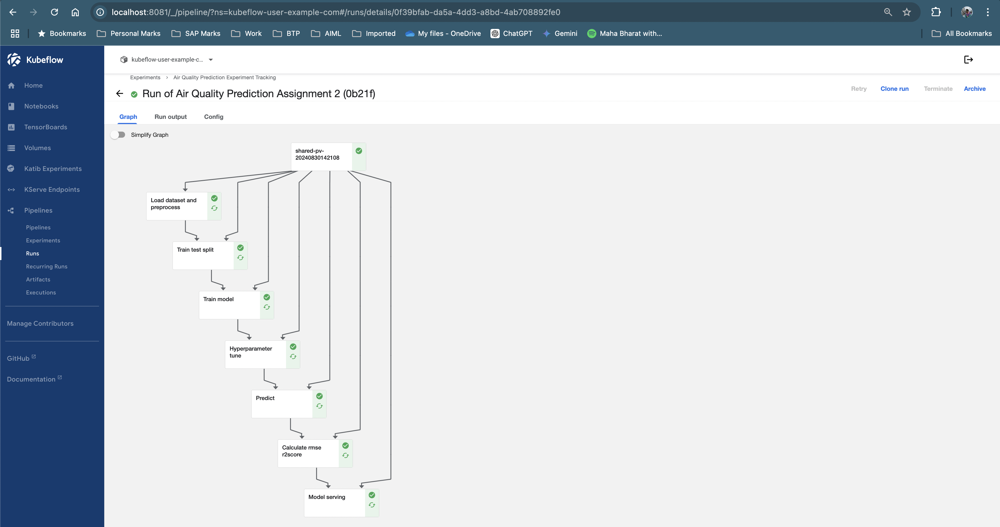

#### Optimize the pipeline for performance and cost-efficiency using different hyperparameters and resource allocations:

Created separate Kubeflow components to process each step in a separate Docker container. Once a step is completed, it triggers the next component and releases all resources. For the deployed model, it automatically scales up or down the number of instances based on usage.

##### Kubeflow componet running in seperate docker container:

Load Dataset container log:
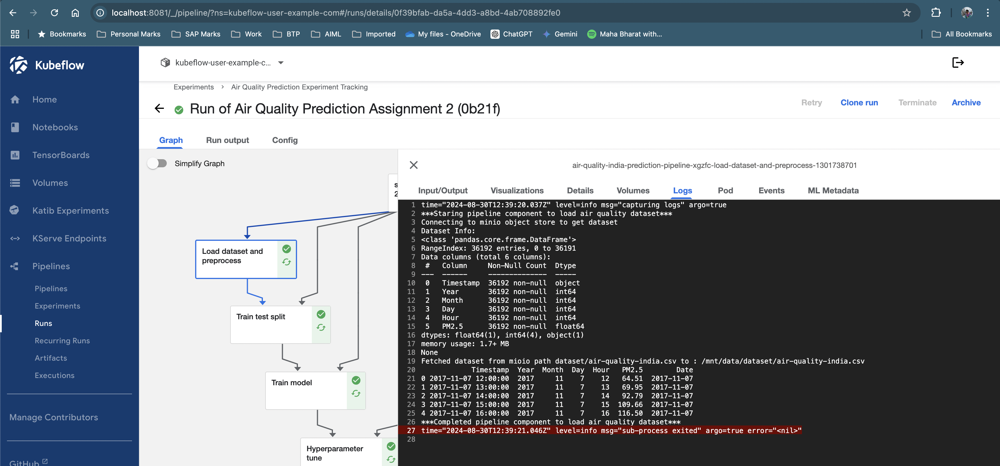

Train model container log:
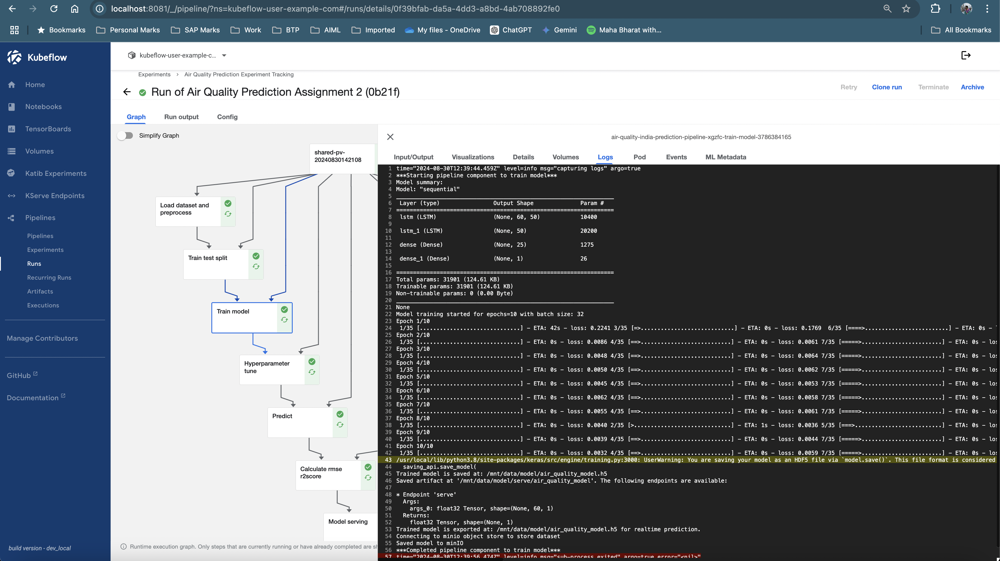

Predict component logs from docker container:
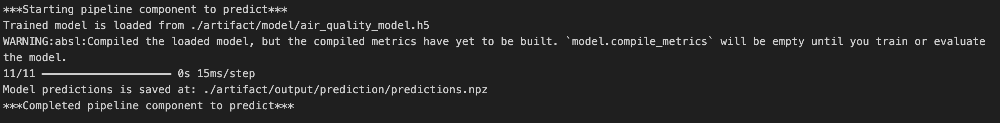

Model performance logs from docker container:
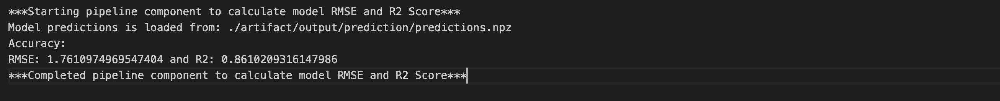

#### Experiment and Hyperparameter Tuning


Experiments Run:
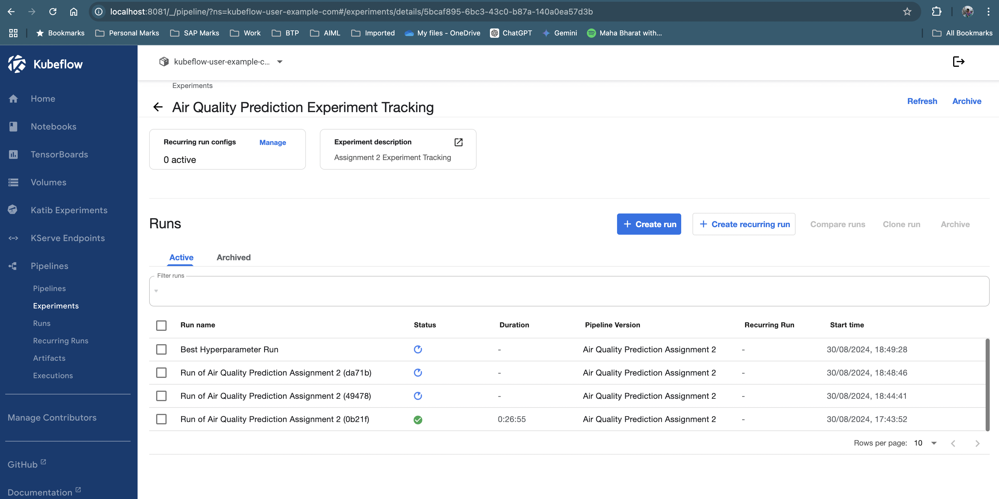

#### Deploy a Kubeflow serving endpoint to expose the trained model for real-time predictions:
Deployed the API via KServe in Kubeflow for real-time request inferences.

Kserving Inference Service:
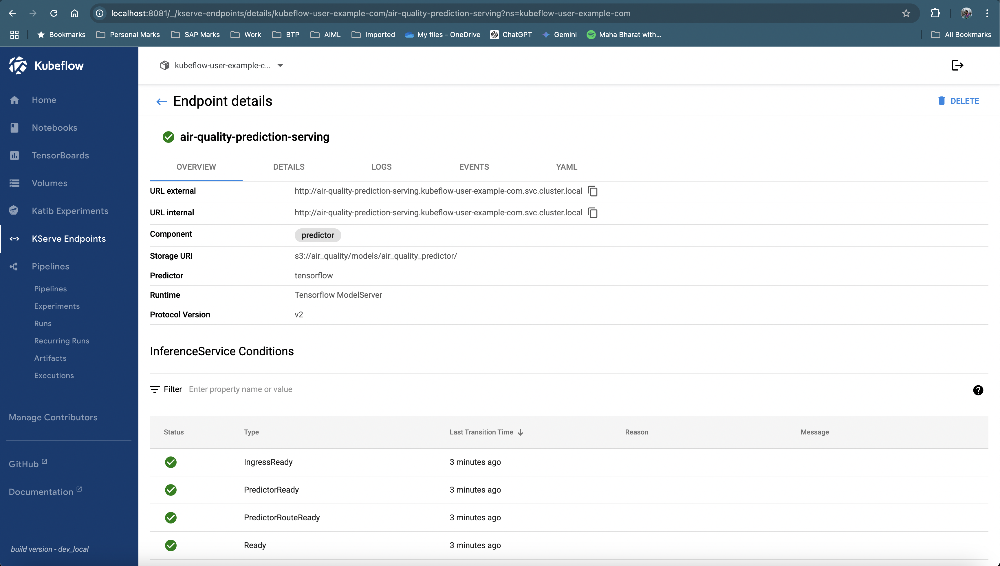

#### Implement a monitoring system to track model performance and resource utilization
Used Grafana and Prometheus to collect resource usage data and display it on the Grafana dashboard.

Grafana with Prometheus Dashboard:
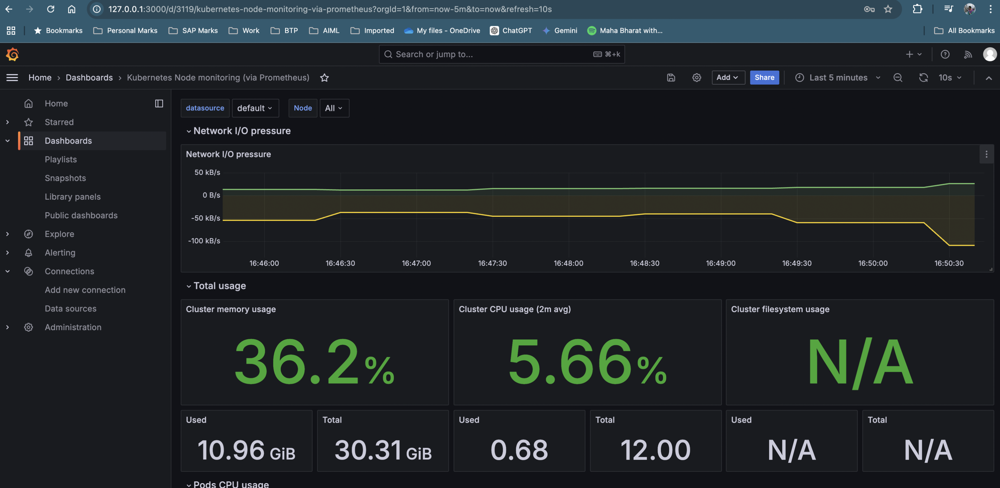